# Identifying Entities in Healthcare Data

##Workspace set up: Import and Install useful packages.

In [18]:
#%pip install sklearn

#%pip install -U pip setuptools wheel
#%pip install -U spacy

  Preparing metadata (setup.py) ... done
  Created wheel for sklearn: filename=sklearn-0.0.post7-py3-none-any.whl size=2951 sha256=dfbbc5d299227e7f659a8aff49c051ded5601eb840999535399e6623732fae41
  Stored in directory: /Users/I301903/Library/Caches/pip/wheels/08/17/db/46486df299847133f69165c029fe388fac45781eb5d436c569
Successfully built sklearn
Note: you may need to restart the kernel to use updated packages.


In [19]:
pip install scikit-learn

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/18/36/60b58b6199547b7b46be03e05508d053162fbce146639bfc65609fa49b23/scikit_learn-1.3.0-cp311-cp311-macosx_12_0_arm64.whl.metadata
  Obtaining dependency information for scipy>=1.5.0 from https://files.pythonhosted.org/packages/db/8d/6419a5a65a538791f49d52cd8f8883bd11b41df0c9d35f500c9650f1e0b7/scipy-1.11.1-cp311-cp311-macosx_12_0_arm64.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 3.8 MB/s eta 0:00:00
  Obtaining dependency information for joblib>=1.1.1 from https://files.pythonhosted.org/packages/10/40/d551139c85db202f1f384ba8bcf96aca2f329440a844f924c8a0040b6d02/joblib-1.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for threadpoolctl>=2.0.0 from https://files.pythonhosted.org/packages/81/12/fd4dea011af9d69e1cad05c75f3f7202cdcbeac9b712eea58ca779a72865/threadpoolctl-3.2.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4

In [1]:
#%pip install pycrf
#%pip install sklearn-crfsuite

import spacy
import sklearn_crfsuite
from sklearn_crfsuite import metrics

model = spacy.load("en_core_web_sm")

##Data Preprocessing

The dataset provided is in the form of one word per line. Let's understand the format of data below:
- Suppose there are *x* words in a sentence, then there will be *x* continuous lines with one word in each line. 
- Further, the two sentences are separated by empty lines. The labels for the data follow the same format.

**We need to pre-process the data to recover the complete sentences (our input sequence) and their labels (output sequences).**

The following function reads the input data provided, processes each line and constructs the sentences from individual words. Whenever an empty line is encountered, a new sentence is started.

### Construct the proper sentences from individual words and print the 5 sentences.

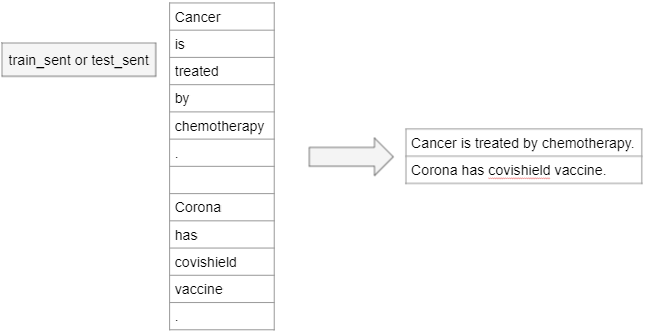

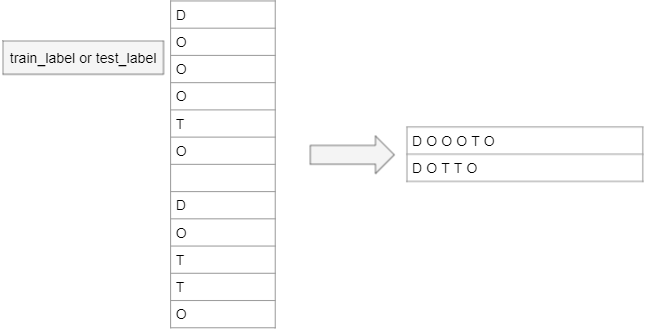

In [2]:
def process_file(filename):
  input_file = open(filename, 'r')
  file_content = input_file.readlines() 
  input_file.close()

  out_lines = [] #To store list of sequences (sentences or labels)

  line_content = ""

  for word in file_content:
    word = word.strip() 
    if word == "": # If empty line, add the current sequence to out_lines
      out_lines.append(line_content)
      line_content = ""; # re-initialize
    else:
      if line_content: #if non-empty, add new word after space
        line_content += " "+word
      else:
        line_content = word # first word, no space required

  return out_lines

In [3]:
train_sentences = process_file('train_sent')
train_labels = process_file('train_label')
test_sentences = process_file('test_sent')
test_labels = process_file('test_label')

In [4]:
# Print the 5 sentences from the processed dataset
for i in range(5):
  print("Sentence:", train_sentences[i])
  print("Labels:", train_labels[i], "\n\n")

Sentence: All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )
Labels: O O O O O O O O O O O O O O O 


Sentence: The `` corrected '' cesarean rate ( maternal-fetal medicine and transported patients excluded ) was 12.4 % ( 273 of 2194 ) , and the `` corrected '' primary rate was 9.6 % ( 190 of 1975 )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: Arrest of dilation was the most common indication in both `` co

### Count the number of sentences in the processed train and test dataset 

In [5]:
print("No. of lines in train_sentences:", len(train_sentences))
print("No. of lines in test_sentences:", len(test_sentences))

No. of lines in train_sentences: 2599
No. of lines in test_sentences: 1056


### Count the number of lines of labels in the processed train and test dataset.

In [6]:
# The lengths of the four variables should match the below output
print("No. of lines in train_labels:", len(train_labels))
print("No. of lines in test_labels:", len(test_labels))

No. of lines in train_labels: 2599
No. of lines in test_labels: 1056


##PoS Tags for Concept Identification

We will first explore what are the various concepts present in the dataset. For this, we will use PoS Tagging. 

We will identify all the words from the corpus that have a tag of NOUN or PROPN (nouns) and prepare a dictionary of their counts. We will then output the top 25 most frequently discussed concepts in the entire corpus.

The key thing to check is that **we are using both test and train sentences.** Note that this is okay because we are using a pre-trained model and applying directly on our data. This is an exploratory analysis on the complete data. Since we are not training anything, there is no point is discarding information in test data

### Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency

In [7]:
concepts = {}

for sentences in (train_sentences, test_sentences):
  for sentence in sentences:
    processed_sentence = model(sentence) # Process each sentence by spacy model
    for token in processed_sentence:
      if(token.pos_ == 'NOUN' or token.pos_ == 'PROPN'): #check if the token is a noun
        concepts[token.text] = concepts.get(token.text, 0) + 1; #increase its frequency if it is noun
        

In [35]:
concepts

{'births': 2,
 'weeks': 37,
 'University': 6,
 'Vermont': 1,
 'delivery': 20,
 'route': 2,
 'indication': 5,
 'age': 56,
 'parity': 4,
 'practice': 31,
 'group': 94,
 'risk': 71,
 'status': 17,
 'rate': 67,
 '%': 247,
 'presentation': 7,
 'medicine': 36,
 'patients': 492,
 'Arrest': 1,
 'dilation': 4,
 'subgroups': 4,
 'rates': 34,
 'care': 56,
 'hospitals': 10,
 'community': 15,
 'groups': 34,
 'trimester': 4,
 'fluid': 8,
 'index': 13,
 'AFI': 8,
 'temperature': 10,
 'increases': 8,
 'decrease': 5,
 'June': 2,
 'August': 6,
 'period': 28,
 'heat': 5,
 'women': 77,
 'singleton': 1,
 'pregnancies': 7,
 'gestation': 4,
 'testing': 25,
 'determinations': 2,
 'ambient': 1,
 'area': 11,
 'day': 36,
 'mean': 3,
 'test': 20,
 'date': 3,
 'Spearman': 1,
 'rank': 2,
 'Correlation': 3,
 'relationship': 12,
 'account': 4,
 'measure': 4,
 'well': 2,
 'being': 2,
 'study': 154,
 'population': 31,
 'diabetes': 31,
 'screening': 12,
 'clinic': 5,
 'Hadassah': 1,
 'Medical': 6,
 'Center': 3,
 'year':

### Print the top 25 most common tokens with NOUN or PROPN PoS tags

The output can be tested if the top 25 most common concepts and their frequencies match the following output.

In [8]:
from collections import Counter

concept_counter = Counter(concepts)

concept_counter.most_common(25)

[('patients', 492),
 ('treatment', 281),
 ('%', 247),
 ('cancer', 200),
 ('therapy', 175),
 ('study', 154),
 ('disease', 142),
 ('cell', 140),
 ('lung', 116),
 ('group', 94),
 ('chemotherapy', 88),
 ('gene', 87),
 ('effects', 85),
 ('results', 79),
 ('women', 77),
 ('use', 74),
 ('TO_SEE', 74),
 ('risk', 71),
 ('cases', 71),
 ('surgery', 71),
 ('analysis', 70),
 ('rate', 67),
 ('response', 66),
 ('survival', 65),
 ('children', 64)]

## Defining features for CRF

Now we will train a custom CRF to identify diseases (D) and treatments (T) from the data. For this, we will use the training data to train the model and evalaute it on the test set.

Things to check:
- All features needs to be correctly defined
- Only the previous word should be used in addition to the current word for evaluating additional features
- BEG and END words have been correctly marked
- POS tags (pos_tags) have been correctly passed to the method and used

We will reuse the features we studied in the code





In [37]:
# Let's define the features to get the feature value for one word.

def getFeaturesForOneWord(sentence, pos, pos_tags):
  word = sentence[pos]

  #Define 12 features with PoS tag as one of the features
  features = [
    'word.lower=' + word.lower(), # serves as word id
    '''
    'word[-3:]=' + word[-3:],     # last three characters
    'word[-2:]=' + word[-2:],     # last two characters
    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase
    'word.isdigit=%s' % word.isdigit(),  # is the word a number
    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter
    '''
    'word.pos=' + pos_tags[pos]
  ]

  #Use the previous word also while defining features
  if(pos > 0):
    prev_word = sentence[pos-1]
    features.extend([
    'prev_word.lower=' + prev_word.lower(), 
    'prev_word.isupper=%s' % prev_word.isupper(),
    'prev_word.isdigit=%s' % prev_word.isdigit(),
    'prev_word.startsWithCapital=%s' % prev_word[0].isupper(),
    'prev_word.pos=' + pos_tags[pos-1]
  ])
  # Mark the begining and the end words of a sentence correctly in the form of features.
  else:
    features.append('BEG') # feature to track begin of sentence 

  if(pos == len(sentence)-1):
    features.append('END') # feature to track end of sentence

  return features

## Getting the features

### Define a function to get the features for a sentence

In [38]:
# Define a function to get features for a sentence using the 'getFeaturesForOneWord' function.
def getFeaturesForOneSentence(sentence):
  
  processed_sentence = model(sentence) #spacy is applied to sentence
  
  pos_tags = [] #correctly identify pos tags
  for token in processed_sentence:
    pos_tags.append(token.pos_)

  sentence_list = sentence.split() # List of words in sentence
  
  #Correctly calling getFeaturesForOneWord defined above
  return [getFeaturesForOneWord(sentence_list, pos, pos_tags) for pos in range(len(sentence_list))]

### Define a function to get the labels of a sentence

In [39]:
# Define a function to get the labels for a sentence.
def getLabelsInListForOneSentence(labels):
  return labels.split()

## Define input and target variables


Correctly computing X and Y sequence matrices for training and test data.
Check that both sentences and labels are processed

### Define the features' values for each sentence as input variable  for CRF model in test and the train dataset 

In [40]:
X_train = [getFeaturesForOneSentence(sentence) for sentence in train_sentences]
X_test = [getFeaturesForOneSentence(sentence) for sentence in test_sentences]

In [41]:
X_train

[[['word.lower=all',
   "\n    'word[-3:]=' + word[-3:],     # last three characters\n    'word[-2:]=' + word[-2:],     # last two characters\n    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase\n    'word.isdigit=%s' % word.isdigit(),  # is the word a number\n    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter\n    word.pos=DET",
   'BEG'],
  ['word.lower=live',
   "\n    'word[-3:]=' + word[-3:],     # last three characters\n    'word[-2:]=' + word[-2:],     # last two characters\n    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase\n    'word.isdigit=%s' % word.isdigit(),  # is the word a number\n    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter\n    word.pos=ADJ",
   'prev_word.lower=all',
   'prev_word.isupper=False',
   'prev_word.isdigit=False',
   'prev_word.startsWithCapital=True',
   'prev_word.pos=DET'],
  ['word.lower=births',
   "\n    'word[

### Define the labels as the target variable for test and the train dataset

In [42]:
Y_train = [getLabelsInListForOneSentence(labels) for labels in train_labels]
Y_test = [getLabelsInListForOneSentence(labels) for labels in test_labels]

## Build the CRF Model

In [43]:
# Build the CRF model.

# Calling CRF 
crf = sklearn_crfsuite.CRF(max_iterations=100)

# Check that only X_train and Y_train are passed
crf.fit(X_train, Y_train)

## Evaluation

Now evaluate the model. For this, the trained model should be run on test sequences (X_test) and not on X_train.

From the features we have defined above, we expect to achieve around 90% F-1


### Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier.

In [32]:
Y_pred = crf.predict(X_test)

### Calculate the f1 score using the actual labels and the predicted labels of the test dataset.

In [33]:
metrics.flat_f1_score(Y_test, Y_pred, average='weighted')

0.888091748978196

##Identifying Diseases and Treatments using Custom NER

We now use the CRF model's prediction to prepare a record of diseases identified in the corpus and treatments used for the diseases. We use only TEST SET for this task.



### Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset.

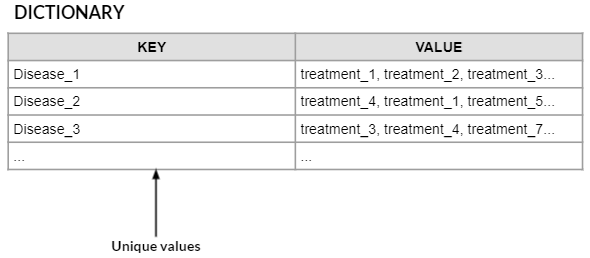

In [21]:
diseases_and_treatments =  {} # dictionary with disease as key an list of treatments as value

for i in range(len(Y_pred)): # For each predicted sequence
  labels = Y_pred[i]

  disease = "";
  treatment = "";
  
  for j in range(len(labels)): # for each individual label in the sequence
    if labels[j] == 'O': # ignore if label is O -- other
      continue

    if(labels[j] == 'D'): # Label D indicates disease, so add the corresponding word from test sentence to the disease name string
      disease += test_sentences[i].split()[j] + " "
      continue

    if(labels[j] == 'T'): # Label T indicates disease, so add the corresponding word from test sentence to the treatment name string
      #print(test_sentences[i].split()[j])
      treatment += test_sentences[i].split()[j] + " "

  disease = disease.strip() # to remove extraneous spaces
  treatment = treatment.strip()

  # add the identified disease and treatment to the dictionary
  # if it is a new disease, directly add the value
  # if the disease has been seen previously, get the treatment list
  # and add current treatment to the list.
  if disease is not "" and treatment is not "":
    if disease not in diseases_and_treatments.keys():
      diseases_and_treatments[disease] = [treatment]
    else:
      treatment_list = diseases_and_treatments.get(disease)
      treatment_list.append(treatment)
      diseases_and_treatments[disease] = treatment_list 

<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/var/folders/hm/r5pwp4rs5zd7v5745srhxk7w0000gn/T/ipykernel_14767/1099638143.py:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if disease is not "" and treatment is not "":
/var/folders/hm/r5pwp4rs5zd7v5745srhxk7w0000gn/T/ipykernel_14767/1099638143.py:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if disease is not "" and treatment is not "":


### Predict the treatment for the disease name: 'hereditary retinoblastoma'

This is just to check the dictionary created. 

In [25]:
diseases_identified = list(diseases_and_treatments.keys())
index = 0

print("Disease: ",diseases_identified[index])
print("Treatment:", diseases_and_treatments.get(diseases_identified[index]))

Disease:  hereditary retinoblastoma
Treatment: ['radiotherapy']
